In [20]:
import geopandas as gpd
from shapely.geometry import Point, MultiPoint
from shapely.ops import unary_union
import matplotlib.pyplot as plt
import numpy as np
from sklearn.cluster import DBSCAN
import geopandas as gpd
from shapely.geometry import Point, MultiPoint
from shapely.ops import unary_union
import matplotlib.pyplot as plt
import folium

In [21]:
# prompt: mount google drive

from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [22]:
# Update these paths to your local files or cloud storage locations
villages_fp = '/content/drive/Shareddrives/Sunbird AI/Projects/GIZ Mini-grid Identification/Phase II/Data/administrative areas/merged_candidate_mg_villages.gpkg'
buildings_fp = '/content/drive/Shareddrives/Sunbird AI/Projects/GIZ Mini-grid Identification/Phase II/Data/buildings/merged_candidate_villages.gpkg'
candidate_mg_fp = '/content/drive/Shareddrives/Sunbird AI/Projects/GIZ Mini-grid Identification/Phase II/Data/grid/optimal placement of minigrids/Candidate_MGs_Merged.geojson'
existing_mg_fp = '/content/drive/Shareddrives/Sunbird AI/Projects/GIZ Mini-grid Identification/Phase II/Data/grid/Existing + Masterplan/existing_mg_sites_reproj.geojson'
all_villages = '/content/drive/Shareddrives/Sunbird AI/Projects/GIZ Mini-grid Identification/Phase II/Data/Sunbird_Lamwo/Village_Boundaries_UBOS_2020.shp'

# Load data into GeoDataFrames
villages = gpd.read_file(villages_fp)
buildings = gpd.read_file(buildings_fp)
candidate_mg = gpd.read_file(candidate_mg_fp)
existing_mg = gpd.read_file(existing_mg_fp)
all_villages = gpd.read_file(all_villages)

# (Optional) Check the CRS and reproject to a metric CRS if needed.
# For example, if your data are in EPSG:4326 (degrees), reproject to UTM.
if villages.crs.to_string() == 'EPSG:4326':
    villages = villages.to_crs(epsg=32633)  # update the EPSG code as needed
    buildings = buildings.to_crs(epsg=32633)
    candidate_mg = candidate_mg.to_crs(epsg=32633)
    existing_mg = existing_mg.to_crs(epsg=32633)

In [23]:
# Convert each layer to EPSG 4326 for display
dvillages = villages.to_crs(epsg=4326)
dbuildings = buildings.to_crs(epsg=4326)
dcandidate_mg = candidate_mg.to_crs(epsg=4326)
dexisting_mg = existing_mg.to_crs(epsg=4326)

"""# Create a folium map centered on the data
m = folium.Map(location=[3.27713,32.49020], zoom_start=12)

# Add Google Maps Basemap
folium.TileLayer(
    tiles="https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}",
    attr="Google Maps",
    name="Google Maps",
).add_to(m)

# Custom Styling Functions for Polygon Layers
def village_style(feature):
    return {"color": "#228B22", "weight": 2, "fillOpacity": 0.3}  # Greenish

def building_style(feature):
    return {"color": "#8B0000", "weight": 1, "fillOpacity": 0.5}  # Dark Red
def all_villages_style(feature):
    return {"color": "#000000", "weight": .5, "fillOpacity": 0}  # Black

# Add Styled Polygon Layers to the Map
folium.GeoJson(all_villages, name="All Villages", style_function=all_villages_style).add_to(m)
folium.GeoJson(dvillages, name="Candidate Villages", style_function=village_style).add_to(m)
folium.GeoJson(dbuildings, name="Buildings", style_function=building_style).add_to(m)
# Add Point Layers as Circles Instead of Default Markers
for idx, row in dcandidate_mg.iterrows():
    folium.CircleMarker(
        location=[row.geometry.centroid.y, row.geometry.centroid.x],  # Extract latitude and longitude
        radius=5,  # Adjust size
        color="black", # Border color
        weight= 0.5,
        fill=True,
        fill_color="red",
        fill_opacity=1,
        popup=f"Candidate MG {idx}"
    ).add_to(m)

for idx, row in dexisting_mg.iterrows():
    folium.CircleMarker(
        location=[row.geometry.centroid.y, row.geometry.centroid.x],  # Extract latitude and longitude
        radius=5,
        color="black", # Border color
        weight= 0.5,
        fill=True,
        fill_color="blue",
        fill_opacity=0.8,
        popup=f"Existing MG {idx}"
    ).add_to(m)

# Add Layer Control
folium.LayerControl().add_to(m)

# Display the map
m"""

'# Create a folium map centered on the data\nm = folium.Map(location=[3.27713,32.49020], zoom_start=12)\n\n# Add Google Maps Basemap\nfolium.TileLayer(\n    tiles="https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}",\n    attr="Google Maps",\n    name="Google Maps",\n).add_to(m)\n\n# Custom Styling Functions for Polygon Layers\ndef village_style(feature):\n    return {"color": "#228B22", "weight": 2, "fillOpacity": 0.3}  # Greenish\n\ndef building_style(feature):\n    return {"color": "#8B0000", "weight": 1, "fillOpacity": 0.5}  # Dark Red\ndef all_villages_style(feature):\n    return {"color": "#000000", "weight": .5, "fillOpacity": 0}  # Black\n\n# Add Styled Polygon Layers to the Map\nfolium.GeoJson(all_villages, name="All Villages", style_function=all_villages_style).add_to(m)\nfolium.GeoJson(dvillages, name="Candidate Villages", style_function=village_style).add_to(m)\nfolium.GeoJson(dbuildings, name="Buildings", style_function=building_style).add_to(m)\n# Add Point Layers as Circ

Some of the candidate minigrids are placed far from efficient energy distribution i.e. far from buildings.

In [24]:
# Create a dictionary: key = village index, value = subset of building GeoDataFrame
village_buildings = {}

for idx, village in villages.iterrows():
    # Get buildings that intersect this village geometry
    intersecting_buildings = buildings[buildings.intersects(village.geometry)]
    village_buildings[idx] = intersecting_buildings

print("Buildings grouped by village:")
for vid, bldgs in village_buildings.items():
    print(f"Village {vid}: {len(bldgs)} building(s)")

Buildings grouped by village:
Village 0: 261 building(s)
Village 1: 379 building(s)
Village 2: 523 building(s)
Village 3: 343 building(s)
Village 4: 424 building(s)
Village 5: 292 building(s)
Village 6: 262 building(s)
Village 7: 274 building(s)
Village 8: 349 building(s)
Village 9: 272 building(s)
Village 10: 110 building(s)
Village 11: 1348 building(s)
Village 12: 260 building(s)
Village 13: 2638 building(s)
Village 14: 416 building(s)
Village 15: 260 building(s)
Village 16: 4194 building(s)
Village 17: 3801 building(s)
Village 18: 178 building(s)
Village 19: 164 building(s)
Village 20: 171 building(s)
Village 21: 176 building(s)
Village 22: 219 building(s)
Village 23: 254 building(s)
Village 24: 234 building(s)
Village 25: 298 building(s)
Village 26: 152 building(s)
Village 27: 57 building(s)
Village 28: 212 building(s)
Village 29: 168 building(s)
Village 30: 205 building(s)
Village 31: 236 building(s)
Village 32: 258 building(s)
Village 33: 153 building(s)
Village 34: 137 building(

# We implement DBSCAN, to sort buildings into clusters and place candidate minigrids at the center of the largest ones.

In [25]:
# Dictionary to hold clustered buildings per village.
clustered_buildings = {}

for vid, bldgs in village_buildings.items():
    if bldgs.empty:
        continue
    # Compute centroids as (x, y) coordinates.
    centroids = bldgs.geometry.centroid
    coords = np.array([[pt.x, pt.y] for pt in centroids])

    # Run DBSCAN clustering. Adjust eps and min_samples as needed.
    clustering = DBSCAN(eps=150, min_samples=10).fit(coords)  # eps=0.001349661234 geographich degrees = 150meters
    labels = clustering.labels_

    # Organize buildings into clusters (ignore noise points labeled as -1)
    clusters = {}
    for label, (_, building) in zip(labels, bldgs.iterrows()):
        if label == -1:
            continue
        clusters.setdefault(label, []).append(building.geometry)

    # Sort clusters by size (largest cluster first)
    sorted_clusters = sorted(clusters.items(), key=lambda item: len(item[1]), reverse=True)
    clustered_buildings[vid] = [geom_list for label, geom_list in sorted_clusters]

print("DBSCAN clustering complete.")

DBSCAN clustering complete.


Village 17 has the most clusters: 21


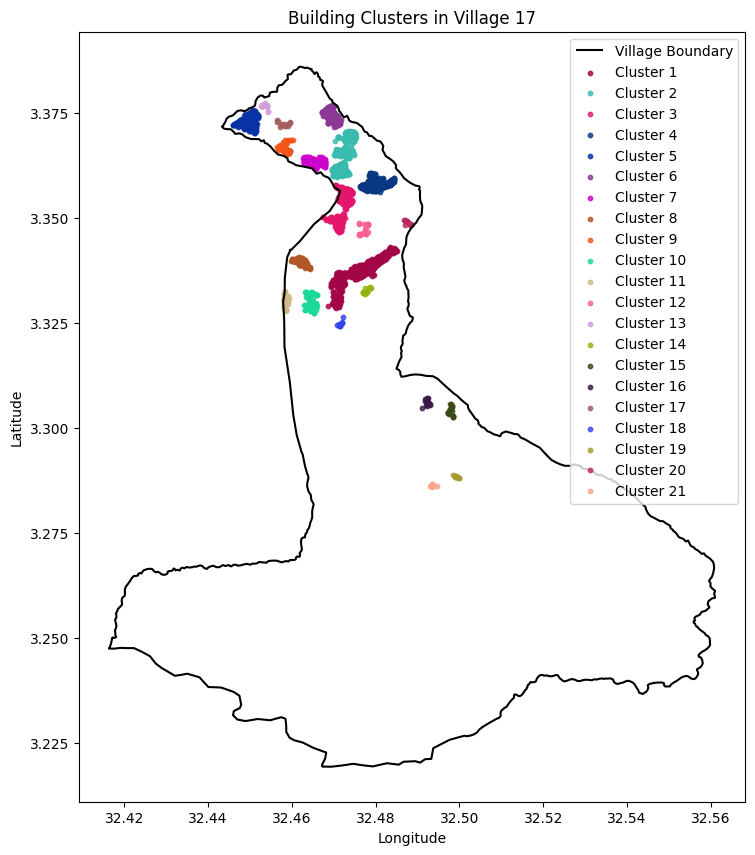

In [26]:
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import MultiPoint
import numpy as np
import random

# Find the village with the largest number of building clusters
village_with_most_clusters = max(clustered_buildings, key=lambda k: len(clustered_buildings[k]))
largest_cluster_count = len(clustered_buildings[village_with_most_clusters])

print(f"Village {village_with_most_clusters} has the most clusters: {largest_cluster_count}")

# Get the polygon of that village and reproject to CRS 4326
village_polygon_4326 = villages.loc[[village_with_most_clusters]].to_crs(epsg=4326)

# Get the buildings for that village and reproject to CRS 4326
buildings_4326 = village_buildings[village_with_most_clusters].to_crs(epsg=4326)

# Generate distinct random colors for clusters
random.seed(42)  # Ensure reproducibility
colors = [plt.cm.tab10(i % 10) if largest_cluster_count <= 10 else (random.random(), random.random(), random.random(), 1) for i in range(largest_cluster_count)]

# Plot
fig, ax = plt.subplots(figsize=(10, 10))

# Plot the village boundary
village_polygon_4326.boundary.plot(ax=ax, color='black', linewidth=1.5, label='Village Boundary')

# Plot the clusters
for i, cluster in enumerate(clustered_buildings[village_with_most_clusters]):
    cluster_points = [building.centroid for building in cluster]
    cluster_multipoint = MultiPoint(cluster_points)
    cluster_centroid = cluster_multipoint.centroid

    # Reproject cluster centroid and buildings to EPSG:4326
    cluster_buildings_4326 = gpd.GeoSeries(cluster, crs=villages.crs).to_crs(epsg=4326)

    # Plot each building in the cluster
    x_coords = [building.centroid.x for building in cluster_buildings_4326]
    y_coords = [building.centroid.y for building in cluster_buildings_4326]
    ax.scatter(x_coords, y_coords, color=colors[i], label=f'Cluster {i+1}', s=10, alpha=0.8)

# Set plot labels and legend
ax.set_title(f'Building Clusters in Village {village_with_most_clusters}')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.legend()
plt.show()


Buildings are clustered based on parameters of the model i.e radius and minimum number of buildings.

In [27]:
# Prepare a list for new candidate minigrid geometries.
assigned_minigrid_geoms = []

# Dictionary to track cluster index usage per village.
assigned_clusters = {}

# Function to check if a candidate point is at least 1 km away from a list of points.
def is_valid_distance(candidate_pt, points, min_dist=1000):
    for pt in points:
        if candidate_pt.distance(pt) < min_dist:
            return False
    return True

# List of existing candidate points (from existing minigrids)
existing_mg_points = list(existing_mg.geometry)

# Process each candidate minigrid.
new_candidate_geoms = []

for idx, row in candidate_mg.iterrows():
    candidate_geom = row.geometry
    village_match = villages[villages.intersects(candidate_geom)]

    # If no village is found, retain the original candidate location.
    if village_match.empty:
        new_candidate_geoms.append(candidate_geom)
        assigned_minigrid_geoms.append(candidate_geom)
        continue

    # Assume the first village that matches (if there are multiple).
    village_idx = village_match.index[0]

    # If no clusters were found for this village, retain the original candidate.
    if village_idx not in clustered_buildings or len(clustered_buildings[village_idx]) == 0:
        new_candidate_geoms.append(candidate_geom)
        assigned_minigrid_geoms.append(candidate_geom)
        continue

    # Initialize cluster usage counter if needed.
    if village_idx not in assigned_clusters:
        assigned_clusters[village_idx] = 0

    clusters = clustered_buildings[village_idx]
    assigned = False
    # Try each cluster in round-robin order.
    for _ in range(len(clusters)):
        cluster_index = assigned_clusters[village_idx] % len(clusters)
        assigned_clusters[village_idx] += 1

        # Compute the union of all building geometries in the cluster, then get its centroid.
        cluster_union = unary_union(clusters[cluster_index])
        cluster_centroid = cluster_union.centroid

        # Check that the candidate is at least 1 km from existing and assigned minigrids.
        if not is_valid_distance(cluster_centroid, existing_mg_points):
            continue
        if not is_valid_distance(cluster_centroid, assigned_minigrid_geoms):
            continue

        # Valid candidate: use this cluster centroid.
        new_candidate_geoms.append(cluster_centroid)
        assigned_minigrid_geoms.append(cluster_centroid)
        assigned = True
        break

    # If no valid cluster was found, use the original candidate location.
    if not assigned:
        new_candidate_geoms.append(candidate_geom)
        assigned_minigrid_geoms.append(candidate_geom)

# Create a new GeoDataFrame for updated candidate minigrids.
new_candidate_mg = candidate_mg.copy()
new_candidate_mg['geometry'] = new_candidate_geoms

print("Candidate minigrid assignment complete.")

Candidate minigrid assignment complete.


In [28]:
# Convert each layer to EPSG 4326 for display and saving
dnew_candidate_mg = new_candidate_mg.to_crs(epsg=4326)


# Create a folium map centered on the data
m = folium.Map(location=[3.27713,32.49020], zoom_start=12)

"""# Add Google Maps Basemap
folium.TileLayer(
    tiles="https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}",
    attr="Google Maps",
    name="Google Maps",
).add_to(m)
"""
# Custom Styling Functions for Polygon Layers
def village_style(feature):
    return {"color": "#228B22", "weight": 2, "fillOpacity": 0.3}  # Greenish

def building_style(feature):
    return {"color": "#800080", "weight": .5, "fillOpacity": 0.5}  # Purple
def all_villages_style(feature):
    return {"color": "#000000", "weight": .5, "fillOpacity": 0}  # Black

# Add Styled Polygon Layers to the Map
folium.GeoJson(all_villages, name="All Villages", style_function=all_villages_style).add_to(m)
folium.GeoJson(dvillages, name="Candidate Villages", style_function=village_style).add_to(m)
folium.GeoJson(dbuildings, name="Buildings", style_function=building_style).add_to(m)
# Add Point Layers as Circles Instead of Default Markers
for idx, row in dcandidate_mg.iterrows():
    folium.CircleMarker(
        location=[row.geometry.centroid.y, row.geometry.centroid.x],  # Extract latitude and longitude
        radius=5,  # Adjust size
        color="black", # Border color
        weight= 0.5,
        fill=True,
        fill_color="red",
        fill_opacity=1,
        popup=f"Candidate MG {idx}"
    ).add_to(m)

for idx, row in dexisting_mg.iterrows():
    folium.CircleMarker(
        location=[row.geometry.centroid.y, row.geometry.centroid.x],  # Extract latitude and longitude
        radius=5,
        color="black",  # Border color
        weight= 0.5,
        fill=True,
        fill_color="blue",
        fill_opacity=0.8,
        popup=f"Existing MG {idx}"
    ).add_to(m)
for idx, row in dnew_candidate_mg.iterrows():
    folium.CircleMarker(
        location=[row.geometry.centroid.y, row.geometry.centroid.x],  # Extract latitude and longitude
        radius=5,  # Adjust size
        color="black",  # Border color
        weight= 0.5,
        fill=True,
        fill_color="white",
        fill_opacity=1,
        popup=f"New Candidate MG {idx}"
    ).add_to(m)

# Add Layer Control
folium.LayerControl().add_to(m)

# Display the map
m

<ipython-input-29-adb552d83870>:8: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend()


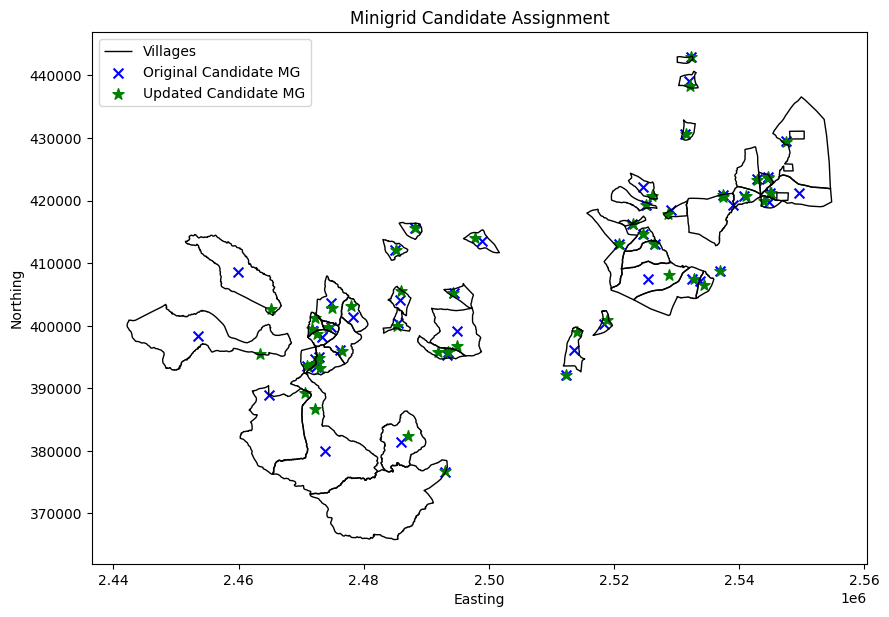

In [29]:
fig, ax = plt.subplots(figsize=(10, 10))
villages.boundary.plot(ax=ax, color='black', linewidth=1, label='Villages')
buildings.plot(ax=ax, color='grey', markersize=5, label='Buildings')
candidate_mg.plot(ax=ax, color='blue', markersize=50, marker='x', label='Original Candidate MG')
#existing_mg.plot(ax=ax, color='red', markersize=50, marker='o', label='Existing MG')
new_candidate_mg.plot(ax=ax, color='green', markersize=70, marker='*', label='Updated Candidate MG')

plt.legend()
plt.title("Minigrid Candidate Assignment")
plt.xlabel("Easting")
plt.ylabel("Northing")
plt.show()

In [30]:

# Save the updated candidate minigrids GeoDataFrame to a new file in your Google Drive.
output_fp = '/content/drive/Shareddrives/Sunbird AI/Projects/GIZ Mini-grid Identification/Phase II/Data/grid/optimal placement of minigrids/new_candidate_mg.geojson'
dnew_candidate_mg.to_file(output_fp, driver='GeoJSON')

print(f"Updated candidate minigrids saved to: {output_fp}")


Updated candidate minigrids saved to: /content/drive/Shareddrives/Sunbird AI/Projects/GIZ Mini-grid Identification/Phase II/Data/grid/optimal placement of minigrids/new_candidate_mg.geojson
